In [22]:
import numpy as np
import pandas as pd
import os
import sys
import getpass
import matplotlib.pyplot as plt

In [23]:
credits_df = pd.read_csv("credits.csv")
movies_df = pd.read_csv("movies.csv")
imdb_df = pd.read_csv("movie_metadata.csv")

credits_df

,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,285,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,206647,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."
3,49026,The Dark Knight Rises,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...","[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de..."
4,49529,John Carter,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de..."
...,...,...,...,...
4798,9367,El Mariachi,"[{""cast_id"": 1, ""character"": ""El Mariachi"", ""c...","[{""credit_id"": ""52fe44eec3a36847f80b280b"", ""de..."
4799,72766,Newlyweds,"[{""cast_id"": 1, ""character"": ""Buzzy"", ""credit_...","[{""credit_id"": ""52fe487dc3a368484e0fb013"", ""de..."
4800,231617,"Signed, Sealed, Delivered","[{""cast_id"": 8, ""character"": ""Oliver O\u2019To...","[{""credit_id"": ""52fe4df3c3a36847f8275ecf"", ""de..."
4801,126186,Shanghai Calling,"[{""cast_id"": 3, ""character"": ""Sam"", ""credit_id...","[{""credit_id"": ""52fe4ad9c3a368484e16a36b"", ""de..."


In [24]:
imdb_df

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5038,Color,Scott Smith,1.0,87.0,2.0,318.0,Daphne Zuniga,637.0,NaN,Comedy|Drama,...,6.0,English,Canada,NaN,NaN,2013.0,470.0,7.7,NaN,84
5039,Color,NaN,43.0,43.0,NaN,319.0,Valorie Curry,841.0,NaN,Crime|Drama|Mystery|Thriller,...,359.0,English,USA,TV-14,NaN,NaN,593.0,7.5,16.00,32000
5040,Color,Benjamin Roberds,13.0,76.0,0.0,0.0,Maxwell Moody,0.0,NaN,Drama|Horror|Thriller,...,3.0,English,USA,NaN,1400.0,2013.0,0.0,6.3,NaN,16
5041,Color,Daniel Hsia,14.0,100.0,0.0,489.0,Daniel Henney,946.0,10443.0,Comedy|Drama|Romance,...,9.0,English,USA,PG-13,NaN,2012.0,719.0,6.3,2.35,660


In [25]:
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

In [26]:
imdb_df

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,886204,4834,Wes Studi,0.0,avatar|future|marine|native|paraplegic,http://www.imdb.com/title/tt0499549/?ref_=fn_t...,3054.0,English,USA,PG-13,2.370000e+08,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,471220,48350,Jack Davenport,0.0,goddess|marriage ceremony|marriage proposal|pi...,http://www.imdb.com/title/tt0449088/?ref_=fn_t...,1238.0,English,USA,PG-13,3.000000e+08,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,Spectre,275868,11700,Stephanie Sigman,1.0,bomb|espionage|sequel|spy|terrorist,http://www.imdb.com/title/tt2379713/?ref_=fn_t...,994.0,English,UK,PG-13,2.450000e+08,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,Tom Hardy,The Dark Knight Rises,1144337,106759,Joseph Gordon-Levitt,0.0,deception|imprisonment|lawlessness|police offi...,http://www.imdb.com/title/tt1345836/?ref_=fn_t...,2701.0,English,USA,PG-13,2.500000e+08,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,Doug Walker,Star Wars: Episode VII - The Force Awakens ...,8,143,NaN,0.0,NaN,http://www.imdb.com/title/tt5289954/?ref_=fn_t...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0
5,Color,Andrew Stanton,462.0,132.0,475.0,530.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,Daryl Sabara,John Carter,212204,1873,Polly Walker,1.0,alien|american civil war|male nipple|mars|prin...,http://www.imdb.com/title/tt0401729/?ref_=fn_t...,738.0,English,USA,PG-13,2.637000e+08,2012.0,632.0,6.6,2.35,24000
6,Color,Sam Raimi,392.0,156.0,0.0,4000.0,James Franco,24000.0,336530303.0,Action|Adventure|Romance,J.K. Simmons,Spider-Man 3,383056,46055,Kirsten Dunst,0.0,sandman|spider man|symbiote|venom|villain,http://www.imdb.com/title/tt0413300/?ref_=fn_t...,1902.0,English,USA,PG-13,2.580000e+08,2007.0,11000.0,6.2,2.35,0
7,Color,Nathan Greno,324.0,100.0,15.0,284.0,Donna Murphy,799.0,200807262.0,Adventure|Animation|Comedy|Family|Fantasy|Musi...,Brad Garrett,Tangled,294810,2036,M.C. Gainey,1.0,17th century|based on fairy tale|disney|flower...,http://www.imdb.com/title/tt0398286/?ref_=fn_t...,387.0,English,USA,PG,2.600000e+08,2010.0,553.0,7.8,1.85,29000
8,Color,Joss Whedon,635.0,141.0,0.0,19000.0,Robert Downey Jr.,26000.0,458991599.0,Action|Adventure|Sci-Fi,Chris Hemsworth,Avengers: Age of Ultron,462669,92000,Scarlett Johansson,4.0,artificial intelligence|based on comic book|ca...,http://www.imdb.com/title/tt2395427/?ref_=fn_t...,1117.0,English,USA,PG-13,2.500000e+08,2015.0,21000.0,7.5,2.35,118000
9,Color,David Yates,375.0,153.0,282.0,10000.0,Daniel Radcliffe,25000.0,301956980.0,Adventure|Family|Fantasy|Mystery,Alan Rickman,Harry Potter and the Half-Blood Prince,321795,58753,Rupert Grint,3.0,blood|book|love|potion|professor,http://www.imdb.com/title/tt0417741/?ref_=fn_t...,973.0,English,UK,PG,2.500000e+08,2009.0,11000.0,7.5,2.35,10000


In [27]:
imdb_df = imdb_df.merge(imdb_df, on = "movie_title")

In [28]:
imdb_df.shape

(5309, 55)

In [29]:
imdb_df.head()

,color_x,director_name_x,num_critic_for_reviews_x,duration_x,director_facebook_likes_x,actor_3_facebook_likes_x,actor_2_name_x,actor_1_facebook_likes_x,gross_x,genres_x,actor_1_name_x,movie_title,num_voted_users_x,cast_total_facebook_likes_x,actor_3_name_x,facenumber_in_poster_x,plot_keywords_x,movie_imdb_link_x,num_user_for_reviews_x,language_x,country_x,content_rating_x,budget_x,title_year_x,actor_2_facebook_likes_x,imdb_score_x,aspect_ratio_x,movie_facebook_likes_x,color_y,director_name_y,num_critic_for_reviews_y,duration_y,director_facebook_likes_y,actor_3_facebook_likes_y,actor_2_name_y,actor_1_facebook_likes_y,gross_y,genres_y,actor_1_name_y,num_voted_users_y,cast_total_facebook_likes_y,actor_3_name_y,facenumber_in_poster_y,plot_keywords_y,movie_imdb_link_y,num_user_for_reviews_y,language_y,country_y,content_rating_y,budget_y,title_year_y,actor_2_facebook_likes_y,imdb_score_y,aspect_ratio_y,movie_facebook_likes_y
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,886204,4834,Wes Studi,0.0,avatar|future|marine|native|paraplegic,http://www.imdb.com/title/tt0499549/?ref_=fn_t...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,886204,4834,Wes Studi,0.0,avatar|future|marine|native|paraplegic,http://www.imdb.com/title/tt0499549/?ref_=fn_t...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,471220,48350,Jack Davenport,0.0,goddess|marriage ceremony|marriage proposal|pi...,http://www.imdb.com/title/tt0449088/?ref_=fn_t...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,471220,48350,Jack Davenport,0.0,goddess|marriage ceremony|marriage proposal|pi...,http://www.imdb.com/title/tt0449088/?ref_=fn_t...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,Spectre,275868,11700,Stephanie Sigman,1.0,bomb|espionage|sequel|spy|terrorist,http://www.imdb.com/title/tt2379713/?ref_=fn_t...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,275868,11700,Stephanie Sigman,1.0,bomb|espionage|sequel|spy|terrorist,http://www.imdb.com/title/tt2379713/?ref_=fn_t...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,Tom Hardy,The Dark Knight Rises,1144337,106759,Joseph Gordon-Levitt,0.0,deception|imprisonment|lawlessness|police offi...,http://www.imdb.com/title/tt1345836/?ref_=fn_t...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,Tom Hardy,1144337,106759,Joseph Gordon-Levitt,0.0,deception|imprisonment|lawlessness|police offi...,http://www.imdb.com/title/tt1345836/?ref_=fn_t...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,Doug Walker,Star Wars: Episode VII - The Force Awakens ...,8,143,NaN,0.0,NaN,http://www.imdb.com/title/tt5289954/?ref_=fn_t...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,Doug Walker,8,143,NaN,0.0,NaN,http://www.imdb.com/title/tt5289954/?ref_=fn_t...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0


In [33]:
imdb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5309 entries, 0 to 5308
Data columns (total 55 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   color_x                      5290 non-null   object 
 1   director_name_x              5201 non-null   object 
 2   num_critic_for_reviews_x     5257 non-null   float64
 3   duration_x                   5294 non-null   float64
 4   director_facebook_likes_x    5201 non-null   float64
 5   actor_3_facebook_likes_x     5286 non-null   float64
 6   actor_2_name_x               5296 non-null   object 
 7   actor_1_facebook_likes_x     5302 non-null   float64
 8   gross_x                      4380 non-null   float64
 9   genres_x                     5309 non-null   object 
 10  actor_1_name_x               5302 non-null   object 
 11  movie_title                  5309 non-null   object 
 12  num_voted_users_x            5309 non-null   int64  
 13  cast_total_faceboo

In [32]:
imdb_df.columns

Index(['color_x', 'director_name_x', 'num_critic_for_reviews_x', 'duration_x',
       'director_facebook_likes_x', 'actor_3_facebook_likes_x',
       'actor_2_name_x', 'actor_1_facebook_likes_x', 'gross_x', 'genres_x',
       'actor_1_name_x', 'movie_title', 'num_voted_users_x',
       'cast_total_facebook_likes_x', 'actor_3_name_x',
       'facenumber_in_poster_x', 'plot_keywords_x', 'movie_imdb_link_x',
       'num_user_for_reviews_x', 'language_x', 'country_x', 'content_rating_x',
       'budget_x', 'title_year_x', 'actor_2_facebook_likes_x', 'imdb_score_x',
       'aspect_ratio_x', 'movie_facebook_likes_x', 'color_y',
       'director_name_y', 'num_critic_for_reviews_y', 'duration_y',
       'director_facebook_likes_y', 'actor_3_facebook_likes_y',
       'actor_2_name_y', 'actor_1_facebook_likes_y', 'gross_y', 'genres_y',
       'actor_1_name_y', 'num_voted_users_y', 'cast_total_facebook_likes_y',
       'actor_3_name_y', 'facenumber_in_poster_y', 'plot_keywords_y',
       'movie_i

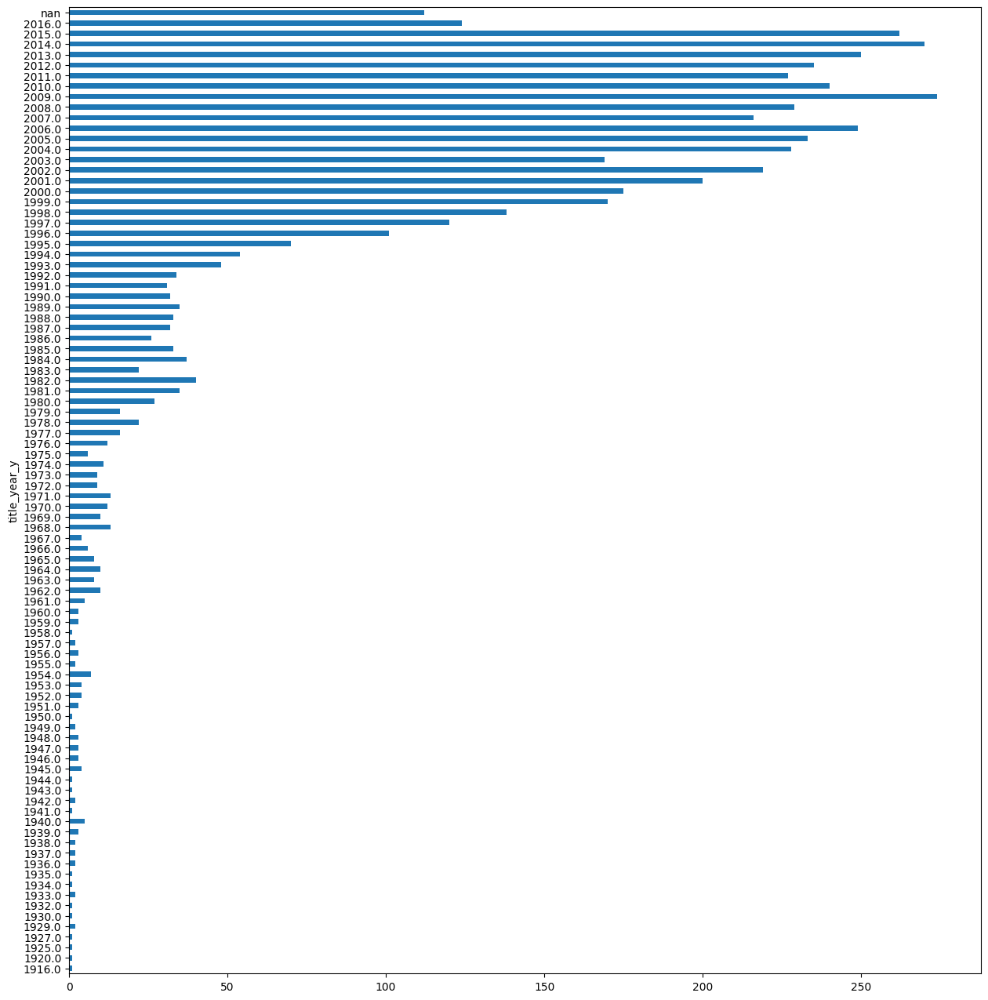

In [34]:
imdb_df.title_year_y.value_counts(dropna=False).sort_index().plot(kind = 'barh', figsize = (15,16))
plt.show()

In [35]:
#select which features to base the recommendation on
imdb_df = imdb_df[['director_name_x','duration_x', 'genres_x', 'movie_title', 'plot_keywords_x','content_rating_x', 'imdb_score_x']]

In [36]:
imdb_df.head()

,director_name_x,duration_x,genres_x,movie_title,plot_keywords_x,content_rating_x,imdb_score_x
0,James Cameron,178.0,Action|Adventure|Fantasy|Sci-Fi,Avatar,avatar|future|marine|native|paraplegic,PG-13,7.9
1,Gore Verbinski,169.0,Action|Adventure|Fantasy,Pirates of the Caribbean: At World's End,goddess|marriage ceremony|marriage proposal|pi...,PG-13,7.1
2,Sam Mendes,148.0,Action|Adventure|Thriller,Spectre,bomb|espionage|sequel|spy|terrorist,PG-13,6.8
3,Christopher Nolan,164.0,Action|Thriller,The Dark Knight Rises,deception|imprisonment|lawlessness|police offi...,PG-13,8.5
4,Doug Walker,NaN,Documentary,Star Wars: Episode VII - The Force Awakens ...,NaN,NaN,7.1


In [37]:
imdb_df = imdb_df.loc[:,['director_name_x','duration_x', 'genres_x', 'movie_title', 'plot_keywords_x','content_rating_x', 'imdb_score_x']]

In [46]:
imdb_df.head()

,director_name_x,duration_x,genres_x,movie_title,plot_keywords_x,content_rating_x,imdb_score_x
0,James Cameron,178.0,Action|Adventure|Fantasy|Sci-Fi,Avatar,avatar|future|marine|native|paraplegic,PG-13,7.9
1,Gore Verbinski,169.0,Action|Adventure|Fantasy,Pirates of the Caribbean: At World's End,goddess|marriage ceremony|marriage proposal|pi...,PG-13,7.1
2,Sam Mendes,148.0,Action|Adventure|Thriller,Spectre,bomb|espionage|sequel|spy|terrorist,PG-13,6.8
3,Christopher Nolan,164.0,Action|Thriller,The Dark Knight Rises,deception|imprisonment|lawlessness|police offi...,PG-13,8.5
4,Doug Walker,NaN,Documentary,Star Wars: Episode VII - The Force Awakens ...,NaN,NaN,7.1


In [47]:
imdb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5309 entries, 0 to 5308
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   director_name_x   5309 non-null   object 
 1   duration_x        5294 non-null   float64
 2   genres_x          5309 non-null   object 
 3   movie_title       5309 non-null   object 
 4   plot_keywords_x   5152 non-null   object 
 5   content_rating_x  5001 non-null   object 
 6   imdb_score_x      5309 non-null   float64
dtypes: float64(2), object(5)
memory usage: 290.5+ KB


In [40]:
imdb_df['director_name_x'] = imdb_df['director_name_x'].replace(np.nan, 'unknown')

In [41]:
imdb_df

,director_name_x,duration_x,genres_x,movie_title,plot_keywords_x,content_rating_x,imdb_score_x
0,James Cameron,178.0,Action|Adventure|Fantasy|Sci-Fi,Avatar,avatar|future|marine|native|paraplegic,PG-13,7.9
1,Gore Verbinski,169.0,Action|Adventure|Fantasy,Pirates of the Caribbean: At World's End,goddess|marriage ceremony|marriage proposal|pi...,PG-13,7.1
2,Sam Mendes,148.0,Action|Adventure|Thriller,Spectre,bomb|espionage|sequel|spy|terrorist,PG-13,6.8
3,Christopher Nolan,164.0,Action|Thriller,The Dark Knight Rises,deception|imprisonment|lawlessness|police offi...,PG-13,8.5
4,Doug Walker,NaN,Documentary,Star Wars: Episode VII - The Force Awakens ...,NaN,NaN,7.1
5,Andrew Stanton,132.0,Action|Adventure|Sci-Fi,John Carter,alien|american civil war|male nipple|mars|prin...,PG-13,6.6
6,Sam Raimi,156.0,Action|Adventure|Romance,Spider-Man 3,sandman|spider man|symbiote|venom|villain,PG-13,6.2
7,Sam Raimi,156.0,Action|Adventure|Romance,Spider-Man 3,sandman|spider man|symbiote|venom|villain,PG-13,6.2
8,Nathan Greno,100.0,Adventure|Animation|Comedy|Family|Fantasy|Musi...,Tangled,17th century|based on fairy tale|disney|flower...,PG,7.8
9,Joss Whedon,141.0,Action|Adventure|Sci-Fi,Avengers: Age of Ultron,artificial intelligence|based on comic book|ca...,PG-13,7.5


In [43]:
imdb_df.isnull().sum()

director_name_x       0
duration_x           15
genres_x              0
movie_title           0
plot_keywords_x     157
content_rating_x    308
imdb_score_x          0
dtype: int64

In [48]:
imdb_df['duration_x'] = imdb_df['duration_x'].replace(np.nan, 'unknown')

In [49]:
imdb_df.isnull().sum()

director_name_x       0
duration_x            0
genres_x              0
movie_title           0
plot_keywords_x     157
content_rating_x    308
imdb_score_x          0
dtype: int64

In [52]:
imdb_df['plot_keywords_x'] = imdb_df['plot_keywords_x'].replace(np.nan, 'unknown')
imdb_df['content_rating_x'] = imdb_df['content_rating_x'].replace(np.nan, 'unknown')

In [53]:
imdb_df.isnull().sum()

director_name_x     0
duration_x          0
genres_x            0
movie_title         0
plot_keywords_x     0
content_rating_x    0
imdb_score_x        0
dtype: int64

In [54]:
imdb_df.duplicated().sum()

388

In [73]:
imdb_df['genres_x'] = imdb_df['genres_x'].str.replace('|', '')

In [74]:
imdb_df

,director_name_x,duration_x,genres_x,movie_title,plot_keywords_x,content_rating_x,imdb_score_x
0,James Cameron,178.0,ActionAdventureFantasySci-Fi,Avatar,avatar|future|marine|native|paraplegic,PG-13,7.9
1,Gore Verbinski,169.0,ActionAdventureFantasy,Pirates of the Caribbean: At World's End,goddess|marriage ceremony|marriage proposal|pi...,PG-13,7.1
2,Sam Mendes,148.0,ActionAdventureThriller,Spectre,bomb|espionage|sequel|spy|terrorist,PG-13,6.8
3,Christopher Nolan,164.0,ActionThriller,The Dark Knight Rises,deception|imprisonment|lawlessness|police offi...,PG-13,8.5
4,Doug Walker,unknown,Documentary,Star Wars: Episode VII - The Force Awakens ...,unknown,unknown,7.1
5,Andrew Stanton,132.0,ActionAdventureSci-Fi,John Carter,alien|american civil war|male nipple|mars|prin...,PG-13,6.6
6,Sam Raimi,156.0,ActionAdventureRomance,Spider-Man 3,sandman|spider man|symbiote|venom|villain,PG-13,6.2
7,Sam Raimi,156.0,ActionAdventureRomance,Spider-Man 3,sandman|spider man|symbiote|venom|villain,PG-13,6.2
8,Nathan Greno,100.0,AdventureAnimationComedyFamilyFantasyMusicalRo...,Tangled,17th century|based on fairy tale|disney|flower...,PG,7.8
9,Joss Whedon,141.0,ActionAdventureSci-Fi,Avengers: Age of Ultron,artificial intelligence|based on comic book|ca...,PG-13,7.5
